In [2]:
import numpy as np
import pandas as pd

# We import the sk learn modules we'll need to segment our new data. We'll need scaler, pca and k-means.
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
# We import pickle in order to be able to load our pickled objects.
import pickle
# We import the Logistic Regression module from sk learn for the purchase probability model.
from sklearn.linear_model import LogisticRegression 
#We import the necessary libraries for visualization. We set seaborn do be our default.
import matplotlib.pyplot as plt
import matplotlib.axes as axs
import seaborn as sns
sns.set()
# We import the Linear Regression module from sk learn for the quantity model.
from sklearn.linear_model import LinearRegression

In [3]:
# load data
df_purchase = pd.read_csv('purchase data.csv')

# Import Scaler
scaler = pickle.load(open('scaler.pickle', 'rb'))
# Import PCA
pca = pickle.load(open('pca.pickle', 'rb'))
# Import K-Means
kmeans_pca = pickle.load(open('kmeans_pca.pickle', 'rb'))
# Standardization
features = df_purchase[['Sex', 'Marital status', 'Age', 'Education', 'Income', 'Occupation', 'Settlement size']]
df_purchase_segm_std = scaler.transform(features)
# Apply PCA
df_purchase_segm_pca = pca.transform(df_purchase_segm_std)
# Segment data
purchase_segm_kmeans_pca = kmeans_pca.predict(df_purchase_segm_pca)

# Create a copy of the data frame
df_purchase_predictors = df_purchase.copy()
# Add segment labels
df_purchase_predictors['Segment'] = purchase_segm_kmeans_pca
segment_dummies = pd.get_dummies(purchase_segm_kmeans_pca, prefix = 'Segment', prefix_sep = '_')
df_purchase_predictors = pd.concat([df_purchase_predictors, segment_dummies], axis = 1)

df_pa = df_purchase_predictors

# Purchase Probability Model

In [4]:
Y = df_pa['Incidence']

In [5]:
x = pd.DataFrame()
x['mean_price'] = (df_pa['Price_1']+
                  df_pa['Price_2']+
                  df_pa['Price_3']+
                  df_pa['Price_4']+
                  df_pa['Price_5'])/5

In [6]:
model_purchase = LogisticRegression(solver = 'sag')
model_purchase.fit(x,Y)

LogisticRegression(solver='sag')

In [7]:
model_purchase.coef_

array([[-2.34763791]])

# Price Elasticity of Purchase probability

In [8]:
df_pa[['Price_1','Price_2','Price_3','Price_4','Price_5']].describe()

,Price_1,Price_2,Price_3,Price_4,Price_5
count,58693.000000,58693.000000,58693.000000,58693.000000,58693.000000
mean,1.392074,1.780999,2.006789,2.159945,2.654798
std,0.091139,0.170868,0.046867,0.089825,0.098272
min,1.100000,1.260000,1.870000,1.760000,2.110000
25%,1.340000,1.580000,1.970000,2.120000,2.630000
50%,1.390000,1.880000,2.010000,2.170000,2.670000
75%,1.470000,1.890000,2.060000,2.240000,2.700000
max,1.590000,1.900000,2.140000,2.260000,2.800000


In [9]:
price_range = np.arange(0.5,3.5,0.01)
price_range

array([0.5 , 0.51, 0.52, 0.53, 0.54, 0.55, 0.56, 0.57, 0.58, 0.59, 0.6 ,
       0.61, 0.62, 0.63, 0.64, 0.65, 0.66, 0.67, 0.68, 0.69, 0.7 , 0.71,
       0.72, 0.73, 0.74, 0.75, 0.76, 0.77, 0.78, 0.79, 0.8 , 0.81, 0.82,
       0.83, 0.84, 0.85, 0.86, 0.87, 0.88, 0.89, 0.9 , 0.91, 0.92, 0.93,
       0.94, 0.95, 0.96, 0.97, 0.98, 0.99, 1.  , 1.01, 1.02, 1.03, 1.04,
       1.05, 1.06, 1.07, 1.08, 1.09, 1.1 , 1.11, 1.12, 1.13, 1.14, 1.15,
       1.16, 1.17, 1.18, 1.19, 1.2 , 1.21, 1.22, 1.23, 1.24, 1.25, 1.26,
       1.27, 1.28, 1.29, 1.3 , 1.31, 1.32, 1.33, 1.34, 1.35, 1.36, 1.37,
       1.38, 1.39, 1.4 , 1.41, 1.42, 1.43, 1.44, 1.45, 1.46, 1.47, 1.48,
       1.49, 1.5 , 1.51, 1.52, 1.53, 1.54, 1.55, 1.56, 1.57, 1.58, 1.59,
       1.6 , 1.61, 1.62, 1.63, 1.64, 1.65, 1.66, 1.67, 1.68, 1.69, 1.7 ,
       1.71, 1.72, 1.73, 1.74, 1.75, 1.76, 1.77, 1.78, 1.79, 1.8 , 1.81,
       1.82, 1.83, 1.84, 1.85, 1.86, 1.87, 1.88, 1.89, 1.9 , 1.91, 1.92,
       1.93, 1.94, 1.95, 1.96, 1.97, 1.98, 1.99, 2.

In [10]:
df_price_range = pd.DataFrame(price_range)
Y_pr = model_purchase.predict_proba(df_price_range)

In [11]:
Y_pr

array([[0.0820844 , 0.9179156 ],
       [0.0838707 , 0.9161293 ],
       [0.08569226, 0.91430774],
       [0.08754959, 0.91245041],
       [0.08944324, 0.91055676],
       [0.09137375, 0.90862625],
       [0.09334165, 0.90665835],
       [0.09534749, 0.90465251],
       [0.09739181, 0.90260819],
       [0.09947513, 0.90052487],
       [0.101598  , 0.898402  ],
       [0.10376096, 0.89623904],
       [0.10596454, 0.89403546],
       [0.10820926, 0.89179074],
       [0.11049565, 0.88950435],
       [0.11282425, 0.88717575],
       [0.11519556, 0.88480444],
       [0.1176101 , 0.8823899 ],
       [0.12006839, 0.87993161],
       [0.12257092, 0.87742908],
       [0.1251182 , 0.8748818 ],
       [0.1277107 , 0.8722893 ],
       [0.13034892, 0.86965108],
       [0.13303333, 0.86696667],
       [0.1357644 , 0.8642356 ],
       [0.13854256, 0.86145744],
       [0.14136828, 0.85863172],
       [0.14424199, 0.85575801],
       [0.14716409, 0.85283591],
       [0.15013501, 0.84986499],
       [0.

In [12]:
purchase_pr = Y_pr[:][:,1]

In [13]:
purchase_pr

array([0.9179156 , 0.9161293 , 0.91430774, 0.91245041, 0.91055676,
       0.90862625, 0.90665835, 0.90465251, 0.90260819, 0.90052487,
       0.898402  , 0.89623904, 0.89403546, 0.89179074, 0.88950435,
       0.88717575, 0.88480444, 0.8823899 , 0.87993161, 0.87742908,
       0.8748818 , 0.8722893 , 0.86965108, 0.86696667, 0.8642356 ,
       0.86145744, 0.85863172, 0.85575801, 0.85283591, 0.84986499,
       0.84684486, 0.84377515, 0.8406555 , 0.83748554, 0.83426495,
       0.83099342, 0.82767065, 0.82429637, 0.82087032, 0.81739226,
       0.81386198, 0.81027929, 0.80664403, 0.80295606, 0.79921525,
       0.79542151, 0.79157479, 0.78767504, 0.78372227, 0.77971648,
       0.77565775, 0.77154614, 0.76738177, 0.76316479, 0.75889539,
       0.75457378, 0.7502002 , 0.74577494, 0.74129832, 0.73677069,
       0.73219245, 0.72756403, 0.72288589, 0.71815854, 0.71338252,
       0.70855841, 0.70368683, 0.69876843, 0.69380393, 0.68879404,
       0.68373955, 0.67864126, 0.67350004, 0.66831676, 0.66309

# Elasticty

In [14]:
pe = model_purchase.coef_[:,0]*price_range * (1-purchase_pr)

In [15]:
df_price_elasticities = pd.DataFrame(price_range)

In [16]:
df_price_elasticities = df_price_elasticities.rename(columns = {0:'Price_Point'})
df_price_elasticities['Mean_pe'] = pe
df_price_elasticities

,Price_Point,Mean_pe
0,0.50,-0.096352
1,0.51,-0.100418
2,0.52,-0.104611
3,0.53,-0.108933
4,0.54,-0.113389
...,...,...
295,3.45,-8.011342
296,3.46,-8.036589
297,3.47,-8.061802
298,3.48,-8.086982


In [17]:
pd.options.display.max_rows = None
df_price_elasticities

,Price_Point,Mean_pe
0,0.50,-0.096352
1,0.51,-0.100418
2,0.52,-0.104611
3,0.53,-0.108933
4,0.54,-0.113389
5,0.55,-0.117982
6,0.56,-0.122714
7,0.57,-0.127590
8,0.58,-0.132612
9,0.59,-0.137784


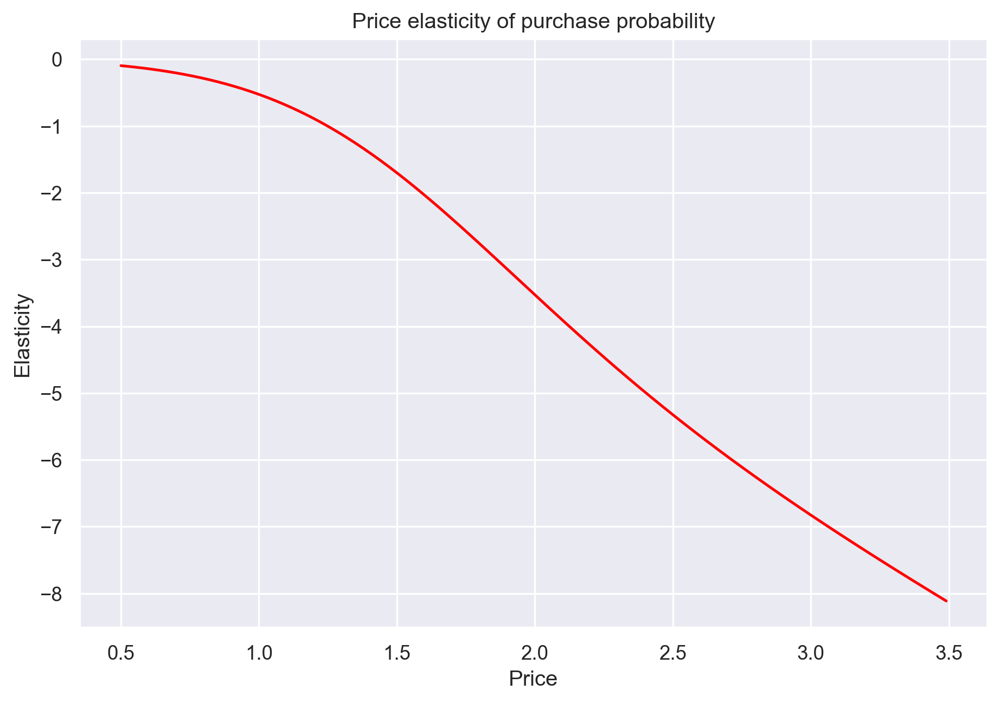

In [18]:
plt.figure(figsize = (9,6))
plt.plot(price_range,pe,color = 'red')
plt.xlabel('Price')
plt.ylabel('Elasticity')
plt.title('Price elasticity of purchase probability');

# Purhase probability by segments

## Carrer Focused

In [19]:
# We filter the data to contain only customers from segment 1, the career-focused.
df_pa_segment_1 = df_pa[df_pa['Segment'] == 1]

In [20]:
# Again we want to predict the purchase probability, so our Y variable is the incidence column.
# Only here we select only the customers from the first segment.
Y = df_pa_segment_1['Incidence']

In [21]:
X = pd.DataFrame()

In [22]:
# We calculate the average price for purchases in segment 1. Our dependant variable contains the mean price of the brands.
X['Mean_Price'] = (df_pa_segment_1['Price_1'] + 
                   df_pa_segment_1['Price_2'] + 
                   df_pa_segment_1['Price_3'] + 
                   df_pa_segment_1['Price_4'] + 
                   df_pa_segment_1['Price_5']) / 5

In [23]:
model_incidence_segment1 = LogisticRegression(solver ='sag')


In [24]:
model_incidence_segment1.fit(X,Y)

LogisticRegression(solver='sag')

In [25]:
model_incidence_segment1.coef_

array([[-1.72287402]])

In [26]:
# Calculate Price Elasticity of the career-focused segment.
Y_segment_1 = model_incidence_segment1.predict_proba(df_price_range)
purchase_pr_segment1 = Y_segment_1[:][:, 1]
pe_segment_1 = model_incidence_segment1.coef_[:, 0] * price_range * (1 - purchase_pr_segment1)

# Result of segment 1

In [27]:
df_price_elasticities['PE_Segment_1'] = pe_segment_1

Text(0.5, 1.0, 'Price Elasticity of Purchase Probability')

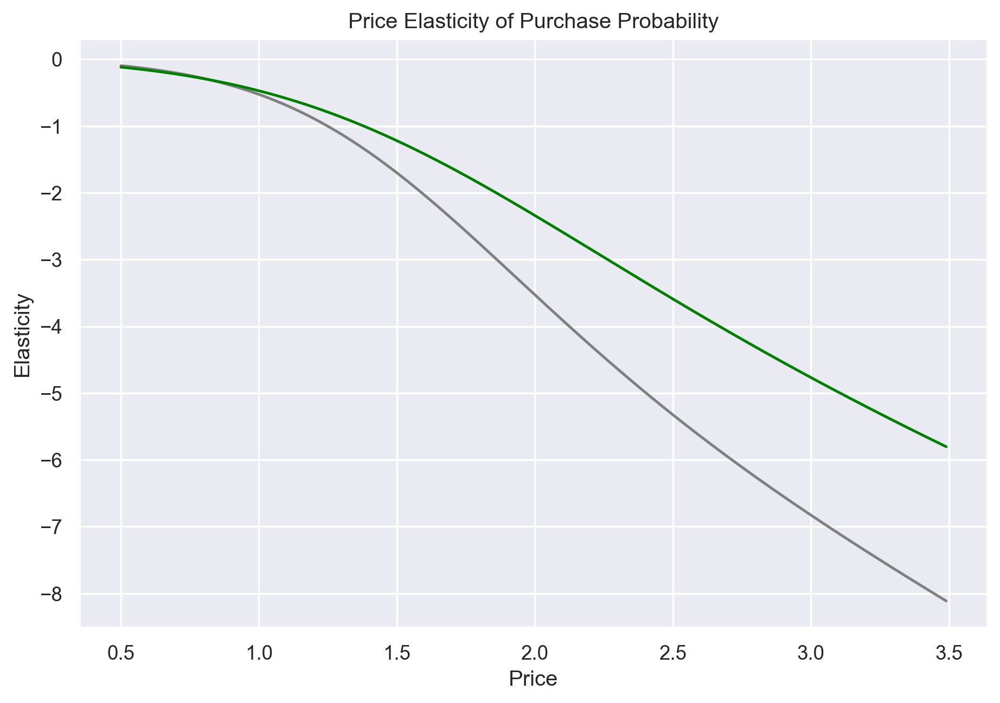

In [28]:



# We plot the elasticities of the average customer and the career-focused segment side by side. 
# The career-focused segment is displayed in green. The same color we used during the descriptive analysis.
plt.figure(figsize = (9, 6))
plt.plot(price_range, pe, color = 'grey')
plt.plot(price_range, pe_segment_1, color = 'green')
plt.xlabel('Price')
plt.ylabel('Elasticity')
plt.title('Price Elasticity of Purchase Probability')

# Segment 2

In [29]:
# Select only customers from segment 2, the fewer-opportunities.
df_pa_segment_2 = df_pa[df_pa['Segment'] == 2]

In [30]:
# Logistic regression model
Y = df_pa_segment_2['Incidence']

X = pd.DataFrame()
# Calculate average price for this segment
X['Mean_Price'] = (df_pa_segment_2['Price_1'] + 
                   df_pa_segment_2['Price_2'] + 
                   df_pa_segment_2['Price_3'] + 
                   df_pa_segment_2['Price_4'] + 
                   df_pa_segment_2['Price_5']) / 5

model_incidence_segment2 = LogisticRegression(solver = 'sag')
model_incidence_segment2.fit(X, Y)

# Calculate price elasticities
model_incidence_segment2.coef_
Y_segment_2 = model_incidence_segment2.predict_proba(df_price_range)
purchase_pr_segment2 = Y_segment_2[:][: , 1]
pe_segment2 = model_incidence_segment2.coef_[:,0] * price_range * ( 1- purchase_pr_segment2)

# Result

In [31]:
df_price_elasticities['PE_Segment_2'] = pe_segment2

Text(0.5, 1.0, 'Price Elasticity of Purchase Probability')

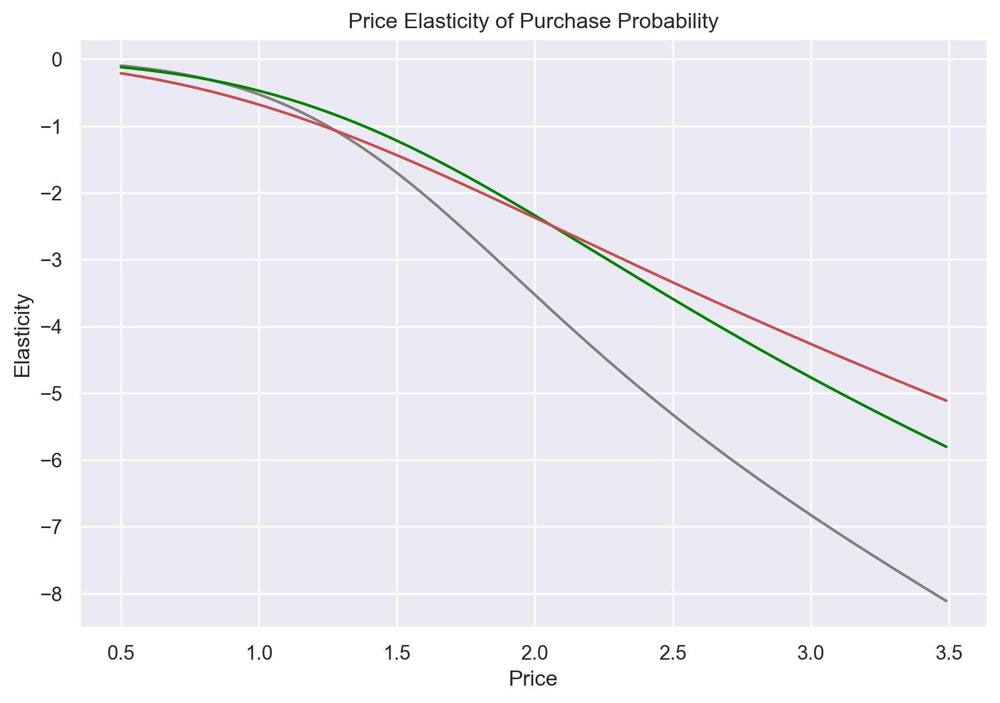

In [32]:
plt.figure(figsize = (9, 6))
plt.plot(price_range, pe, color = 'grey')
plt.plot(price_range, pe_segment_1, color = 'green')
plt.plot(price_range, pe_segment2, color = 'r')
plt.xlabel('Price')
plt.ylabel('Elasticity')
plt.title('Price Elasticity of Purchase Probability')

# Segment 3

In [33]:
# Select only customers from segment 2, the fewer-opportunities.
df_pa_segment_3 = df_pa[df_pa['Segment'] == 3]

In [34]:
# Logistic regression model
Y = df_pa_segment_3['Incidence']

X = pd.DataFrame()
# Calculate average price for this segment
X['Mean_Price'] = (df_pa_segment_3['Price_1'] + 
                   df_pa_segment_3['Price_2'] + 
                   df_pa_segment_3['Price_3'] + 
                   df_pa_segment_3['Price_4'] + 
                   df_pa_segment_3['Price_5']) / 5

model_incidence_segment3 = LogisticRegression(solver = 'sag')
model_incidence_segment3.fit(X, Y)

# Calculate price elasticities
model_incidence_segment3.coef_
Y_segment_3 = model_incidence_segment3.predict_proba(df_price_range)
purchase_pr_segment3 = Y_segment_3[:][: , 1]
pe_segment3 = model_incidence_segment3.coef_[:,0] * price_range * ( 1- purchase_pr_segment3)

# Result

In [35]:
df_price_elasticities['PE_Segment_3'] = pe_segment3

Text(0.5, 1.0, 'Price Elasticity of Purchase Probability')

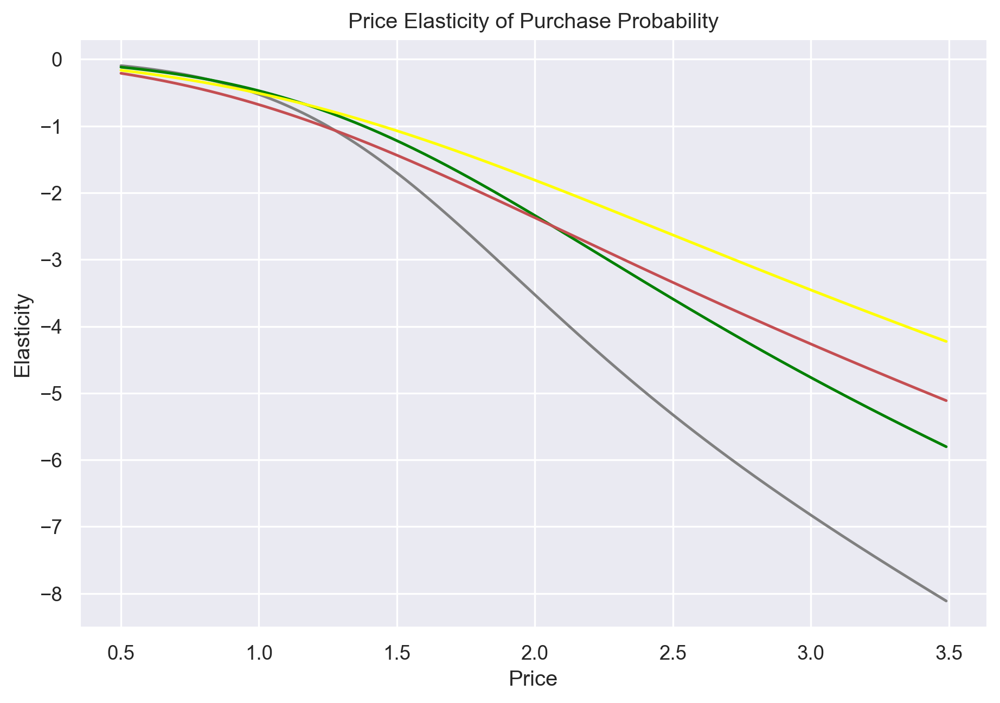

In [36]:
plt.figure(figsize = (9, 6))
plt.plot(price_range, pe, color = 'grey')
plt.plot(price_range, pe_segment_1, color = 'green')
plt.plot(price_range, pe_segment2, color = 'r')
plt.plot(price_range, pe_segment3, color = 'yellow')
plt.xlabel('Price')
plt.ylabel('Elasticity')
plt.title('Price Elasticity of Purchase Probability')

# Segment 4 

In [37]:
# Select only customers from segment 2, the fewer-opportunities.
df_pa_segment_0 = df_pa[df_pa['Segment'] == 0]

In [38]:
# Logistic regression model
Y = df_pa_segment_0['Incidence']

X = pd.DataFrame()
# Calculate average price for this segment
X['Mean_Price'] = (df_pa_segment_0['Price_1'] + 
                   df_pa_segment_0['Price_2'] + 
                   df_pa_segment_0['Price_3'] + 
                   df_pa_segment_0['Price_4'] + 
                   df_pa_segment_0['Price_5']) / 5

model_incidence_segment0 = LogisticRegression(solver = 'sag')
model_incidence_segment0.fit(X, Y)

# Calculate price elasticities
model_incidence_segment0.coef_
Y_segment_0 = model_incidence_segment0.predict_proba(df_price_range)
purchase_pr_segment0 = Y_segment_0[:][: , 1]
pe_segment0 = model_incidence_segment0.coef_[:,0] * price_range * ( 1- purchase_pr_segment0)

# Result

In [39]:
df_price_elasticities['PE_Segment_0'] = pe_segment0

Text(0.5, 1.0, 'Price Elasticity of Purchase Probability')

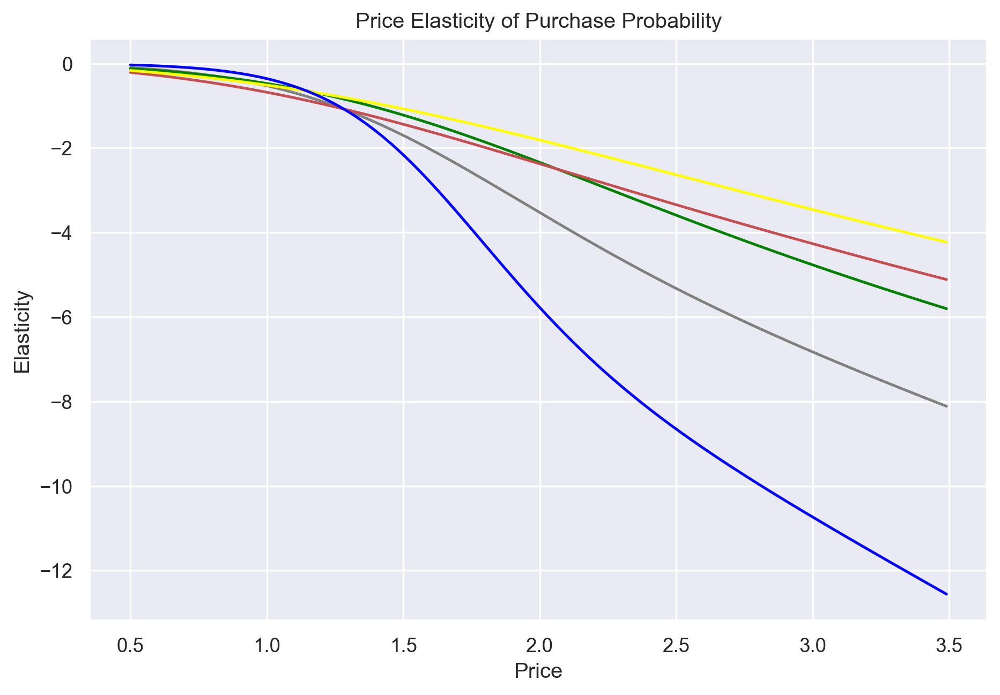

In [40]:
plt.figure(figsize = (9, 6))
plt.plot(price_range, pe, color = 'grey')
plt.plot(price_range, pe_segment_1, color = 'green')
plt.plot(price_range, pe_segment2, color = 'r')
plt.plot(price_range, pe_segment3, color = 'yellow')
plt.plot(price_range, pe_segment0, color = 'blue')
plt.xlabel('Price')
plt.ylabel('Elasticity')
plt.title('Price Elasticity of Purchase Probability')

# Purchase probability and Promotion features

In [41]:
Y = df_pa['Incidence']

In [42]:
X = pd.DataFrame()
X['Mean_Price'] = ((df_pa['Price_1'] + 
                   df_pa['Price_2'] + 
                   df_pa['Price_3'] + 
                   df_pa['Price_4'] + 
                   df_pa['Price_5']) / 5
                  )

In [43]:
X['Mean_Promotion'] = ((df_pa['Promotion_1'] + 
                   df_pa['Promotion_2'] + 
                   df_pa['Promotion_3'] + 
                   df_pa['Promotion_4'] + 
                   df_pa['Promotion_5']) / 5
                  )

# Model Estimation

In [44]:
model_incidence_promotion = LogisticRegression(solver ='sag')

In [45]:
model_incidence_promotion.fit(X,Y)

LogisticRegression(solver='sag')

In [46]:
model_incidence_promotion.coef_

array([[-1.49420695,  0.56149986]])

# Price Elasticity with Promotion

In [47]:
df_price_elasticity_promotion = pd.DataFrame(price_range)

In [48]:
df_price_elasticity_promotion = df_price_elasticity_promotion.rename(columns = {0:'Price_range'})

In [49]:
df_price_elasticity_promotion ['Promotion']=1

In [50]:
Y_promotion = model_incidence_promotion.predict_proba(df_price_elasticity_promotion )

In [51]:
promo = Y_promotion[:,1]
price_elasticity_promo = (model_incidence_promotion.coef_[:,0]*price_range)*(1-promo)

In [52]:
df_price_elasticities['Elasticity_promotion']= price_elasticity_promo
df_price_elasticities

,Price_Point,Mean_pe,PE_Segment_1,PE_Segment_2,PE_Segment_3,PE_Segment_0,Elasticity_promotion
0,0.50,-0.096352,-0.118700,-0.210433,-0.165259,-0.032200,-0.125808
1,0.51,-0.100418,-0.122884,-0.216980,-0.170179,-0.034026,-0.129927
2,0.52,-0.104611,-0.127161,-0.223634,-0.175173,-0.035941,-0.134125
3,0.53,-0.108933,-0.131535,-0.230396,-0.180241,-0.037950,-0.138402
4,0.54,-0.113389,-0.136005,-0.237267,-0.185384,-0.040055,-0.142761
5,0.55,-0.117982,-0.140574,-0.244248,-0.190601,-0.042261,-0.147201
6,0.56,-0.122714,-0.145242,-0.251339,-0.195895,-0.044573,-0.151725
7,0.57,-0.127590,-0.150013,-0.258542,-0.201265,-0.046996,-0.156333
8,0.58,-0.132612,-0.154886,-0.265856,-0.206711,-0.049533,-0.161025
9,0.59,-0.137784,-0.159864,-0.273283,-0.212235,-0.052190,-0.165803


# Price Elasticity without promotion

In [53]:
df_price_elasticity_promotion_no = pd.DataFrame(price_range)
df_price_elasticity_promotion_no = df_price_elasticity_promotion_no.rename(columns = {0: "Price_Range"})

In [54]:
df_price_elasticity_promotion_no['Promotion'] = 0

In [55]:
Y_no_promo = model_incidence_promotion.predict_proba(df_price_elasticity_promotion_no)

In [56]:
no_promo = Y_no_promo[: , 1]

In [57]:
price_elasticity_no_promo = model_incidence_promotion.coef_[:, 0] * price_range *(1- no_promo)

In [58]:
df_price_elasticities['Elasticity_Promotion_0'] = price_elasticity_no_promo

Text(0.5, 1.0, 'Price Elasticity of Purchase Probability with and without Promotion')

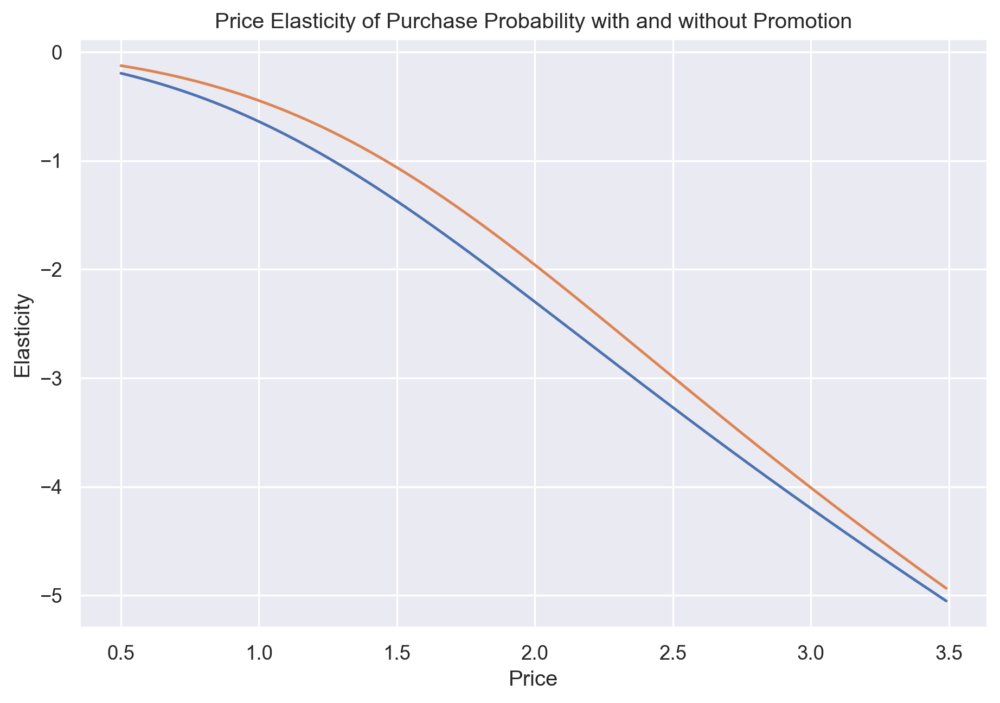

In [59]:
plt.figure(figsize = (9, 6))
plt.plot(price_range, price_elasticity_no_promo)
plt.plot(price_range, price_elasticity_promo)
plt.xlabel('Price')
plt.ylabel('Elasticity')
plt.title('Price Elasticity of Purchase Probability with and without Promotion')

# Brand choice 

## Data prep

In [60]:
brand_choice = df_pa[df_pa['Incidence']==1]
pd.options.display.max_rows =100
brand_choice

,ID,Day,Incidence,Brand,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,...,Age,Education,Income,Occupation,Settlement size,Segment,Segment_0,Segment_1,Segment_2,Segment_3
6,200000001,28,1,2,2,0,0,1.50,1.90,1.99,...,47,1,110866,1,0,0,1,0,0,0
11,200000001,58,1,5,1,0,0,1.39,1.90,1.91,...,47,1,110866,1,0,0,1,0,0,0
19,200000001,110,1,1,2,0,0,1.47,1.90,1.99,...,47,1,110866,1,0,0,1,0,0,0
24,200000001,142,1,4,1,0,0,1.21,1.35,1.99,...,47,1,110866,1,0,0,1,0,0,0
29,200000001,183,1,2,3,0,0,1.46,1.88,1.97,...,47,1,110866,1,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58621,200000500,296,1,2,6,0,0,1.48,1.89,2.01,...,42,1,120946,1,0,0,1,0,0,0
58648,200000500,460,1,1,12,0,0,1.35,1.57,2.02,...,42,1,120946,1,0,0,1,0,0,0
58674,200000500,641,1,2,7,0,0,1.50,1.85,2.06,...,42,1,120946,1,0,0,1,0,0,0
58687,200000500,697,1,2,6,0,0,1.42,1.51,1.97,...,42,1,120946,1,0,0,1,0,0,0


In [61]:
Y =brand_choice['Brand']

In [62]:
brand_choice.columns.values

array(['ID', 'Day', 'Incidence', 'Brand', 'Quantity', 'Last_Inc_Brand',
       'Last_Inc_Quantity', 'Price_1', 'Price_2', 'Price_3', 'Price_4',
       'Price_5', 'Promotion_1', 'Promotion_2', 'Promotion_3',
       'Promotion_4', 'Promotion_5', 'Sex', 'Marital status', 'Age',
       'Education', 'Income', 'Occupation', 'Settlement size', 'Segment',
       'Segment_0', 'Segment_1', 'Segment_2', 'Segment_3'], dtype=object)

In [63]:
features = ['Price_1','Price_2','Price_3','Price_4','Price_5']

In [64]:
X = brand_choice[features ]

In [65]:
model_brand_choice = LogisticRegression(solver = 'sag',multi_class='multinomial')

In [66]:
model_brand_choice.fit(X,Y)

LogisticRegression(multi_class='multinomial', solver='sag')

In [67]:
model_brand_choice.coef_

array([[-3.9159538 ,  0.65846194,  2.41773951,  0.70408853, -0.20210537],
       [ 1.27461155, -1.87985514, -0.21265071, -0.20634076,  0.58786811],
       [ 1.62418783,  0.56210752,  0.50088277,  1.03950482,  0.45279139],
       [ 0.57453557,  0.39558733, -1.40061567, -1.24624462,  0.24934736],
       [ 0.44261886,  0.26369835, -1.3053559 , -0.29100797, -1.08790149]])

In [68]:
bc_coef = pd.DataFrame(model_brand_choice.coef_)
bc_coef

,0,1,2,3,4
0,-3.915954,0.658462,2.417740,0.704089,-0.202105
1,1.274612,-1.879855,-0.212651,-0.206341,0.587868
2,1.624188,0.562108,0.500883,1.039505,0.452791
3,0.574536,0.395587,-1.400616,-1.246245,0.249347
4,0.442619,0.263698,-1.305356,-0.291008,-1.087901


In [69]:
bc_coef = pd.DataFrame(np.transpose(model_brand_choice.coef_))

In [70]:
coefficient = ['coef_brand1','coef_brand2','coef_brand3','coef_brand4','coef_brand5']

In [71]:
bc_coef.columns = [coefficient]

In [72]:
price = ['Price_1','Price_2','Price_3','Price_4','Price_5']

In [73]:
bc_coef.index = [price]

In [74]:
bc_coef = bc_coef.round(2)

In [75]:
bc_coef

,coef_brand1,coef_brand2,coef_brand3,coef_brand4,coef_brand5
Price_1,-3.92,1.27,1.62,0.57,0.44
Price_2,0.66,-1.88,0.56,0.40,0.26
Price_3,2.42,-0.21,0.50,-1.40,-1.31
Price_4,0.70,-0.21,1.04,-1.25,-0.29
Price_5,-0.20,0.59,0.45,0.25,-1.09


# own price elasticity brand 5

In [76]:
df_own_brand_5 = pd.DataFrame(index = np.arange(price_range.size))

In [77]:
df_own_brand_5['Price_1'] = brand_choice['Price_1'].mean()
df_own_brand_5['Price_2'] = brand_choice['Price_2'].mean()
df_own_brand_5['Price_3'] = brand_choice['Price_3'].mean()
df_own_brand_5['Price_4'] = brand_choice['Price_4'].mean()
df_own_brand_5['Price_5'] = price_range
df_own_brand_5


,Price_1,Price_2,Price_3,Price_4,Price_5
0,1.384559,1.764717,2.006694,2.159658,0.50
1,1.384559,1.764717,2.006694,2.159658,0.51
2,1.384559,1.764717,2.006694,2.159658,0.52
3,1.384559,1.764717,2.006694,2.159658,0.53
4,1.384559,1.764717,2.006694,2.159658,0.54
...,...,...,...,...,...
295,1.384559,1.764717,2.006694,2.159658,3.45
296,1.384559,1.764717,2.006694,2.159658,3.46
297,1.384559,1.764717,2.006694,2.159658,3.47
298,1.384559,1.764717,2.006694,2.159658,3.48


In [78]:
predict_brand_5 = model_brand_choice.predict_proba(df_own_brand_5)

In [79]:
pr_own_brand_5 = predict_brand_5[:][:,4]

In [80]:
beta5 = bc_coef.iloc[4,4]
beta5

-1.09

In [81]:
own_price_elasticity_brand_5 = beta5*price_range*(1-pr_own_brand_5)

In [82]:
df_price_elasticities['Brand_5'] = own_price_elasticity_brand_5
pd.options.display.max_rows = None
df_price_elasticities

,Price_Point,Mean_pe,PE_Segment_1,PE_Segment_2,PE_Segment_3,PE_Segment_0,Elasticity_promotion,Elasticity_Promotion_0,Brand_5
0,0.50,-0.096352,-0.118700,-0.210433,-0.165259,-0.032200,-0.125808,-0.195749,-0.049055
1,0.51,-0.100418,-0.122884,-0.216980,-0.170179,-0.034026,-0.129927,-0.201873,-0.050616
2,0.52,-0.104611,-0.127161,-0.223634,-0.175173,-0.035941,-0.134125,-0.208100,-0.052206
3,0.53,-0.108933,-0.131535,-0.230396,-0.180241,-0.037950,-0.138402,-0.214431,-0.053827
4,0.54,-0.113389,-0.136005,-0.237267,-0.185384,-0.040055,-0.142761,-0.220865,-0.055477
5,0.55,-0.117982,-0.140574,-0.244248,-0.190601,-0.042261,-0.147201,-0.227405,-0.057158
6,0.56,-0.122714,-0.145242,-0.251339,-0.195895,-0.044573,-0.151725,-0.234050,-0.058870
7,0.57,-0.127590,-0.150013,-0.258542,-0.201265,-0.046996,-0.156333,-0.240802,-0.060614
8,0.58,-0.132612,-0.154886,-0.265856,-0.206711,-0.049533,-0.161025,-0.247661,-0.062390
9,0.59,-0.137784,-0.159864,-0.273283,-0.212235,-0.052190,-0.165803,-0.254628,-0.064199


Text(0.5, 1.0, 'own price elasticity of purcahse_prob for 5')

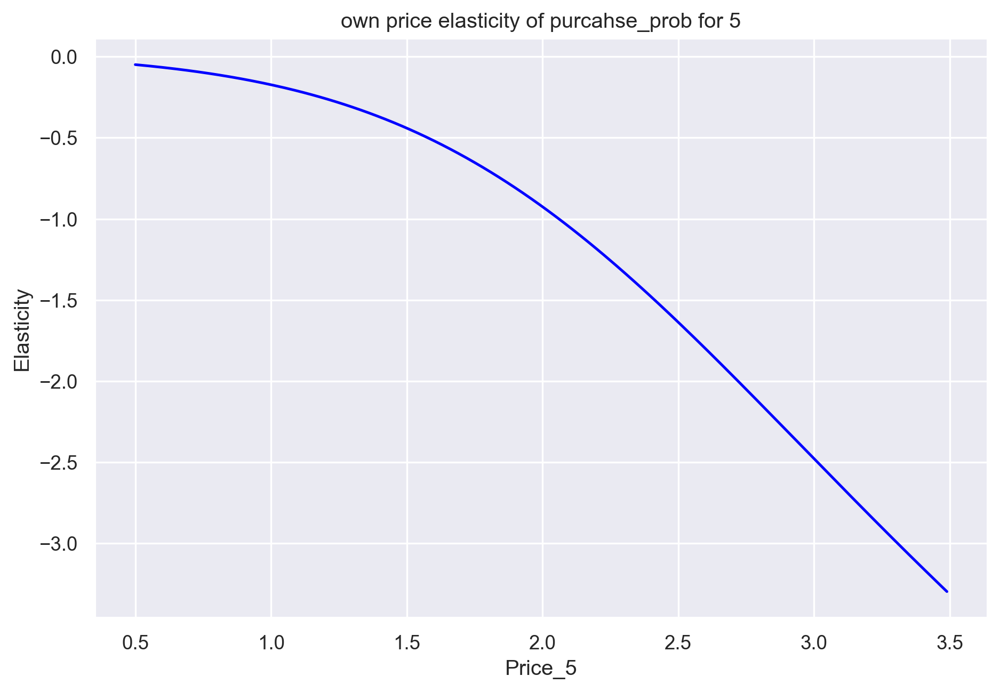

In [83]:
plt.figure(figsize=(9,6))
plt.plot(price_range ,own_price_elasticity_brand_5,color ='blue')
plt.xlabel('Price_5')
plt.ylabel('Elasticity')
plt.title('own price elasticity of purcahse_prob for 5')

# Cross price elasticity brand 5 , cross brand 5

In [84]:
# We want to examine the effect of the changes in price of a competitor brand.
# As we've discussed in the lecture, the brand which comes closest to our own brand is brand 4. 
# Therefore, we need to examine changes in the price of this brand.
# Keep in mind, we could examine the cross price elasticities for any of the remaining brands, 
# we just need to update this data frame accordingly to contain the respective brand.
df_brand5_cross_brand4 = pd.DataFrame(index = np.arange(price_range.size))
df_brand5_cross_brand4['Price_1'] = brand_choice['Price_1'].mean()
df_brand5_cross_brand4['Price_2'] = brand_choice['Price_2'].mean()
df_brand5_cross_brand4['Price_3'] = brand_choice['Price_3'].mean()
df_brand5_cross_brand4['Price_4'] = price_range
df_brand5_cross_brand4['Price_5'] = brand_choice['Price_5'].mean()

In [85]:
df_brand5_cross_brand4.head()

,Price_1,Price_2,Price_3,Price_4,Price_5
0,1.384559,1.764717,2.006694,0.50,2.654296
1,1.384559,1.764717,2.006694,0.51,2.654296
2,1.384559,1.764717,2.006694,0.52,2.654296
3,1.384559,1.764717,2.006694,0.53,2.654296
4,1.384559,1.764717,2.006694,0.54,2.654296


In [86]:
predict_brand5_cross_brand4 = model_brand_choice.predict_proba(df_brand5_cross_brand4)

In [87]:
pr_brand_4 = predict_brand5_cross_brand4[:][:, 3]

In [88]:
beta5

-1.09

In [89]:
# In order to calculate the cross brand price elasticity, we need to use the new formula we introduced in the lecture.
# The elasticity is equal to negative the price coefficient of the own brand multiplied by the price of the cross brand,
# further multiplied by the probability for choosing the cross brand.
brand5_cross_brand4_price_elasticity = -beta5 * price_range * pr_brand_4

In [90]:
# Update price elasticities data frame to include the cross price elasticities for brand 5 with respect to brand 4.
df_price_elasticities['Brand_5_Cross_Brand_4'] = brand5_cross_brand4_price_elasticity
df_price_elasticities

,Price_Point,Mean_pe,PE_Segment_1,PE_Segment_2,PE_Segment_3,PE_Segment_0,Elasticity_promotion,Elasticity_Promotion_0,Brand_5,Brand_5_Cross_Brand_4
0,0.50,-0.096352,-0.118700,-0.210433,-0.165259,-0.032200,-0.125808,-0.195749,-0.049055,0.332011
1,0.51,-0.100418,-0.122884,-0.216980,-0.170179,-0.034026,-0.129927,-0.201873,-0.050616,0.337287
2,0.52,-0.104611,-0.127161,-0.223634,-0.175173,-0.035941,-0.134125,-0.208100,-0.052206,0.342506
3,0.53,-0.108933,-0.131535,-0.230396,-0.180241,-0.037950,-0.138402,-0.214431,-0.053827,0.347668
4,0.54,-0.113389,-0.136005,-0.237267,-0.185384,-0.040055,-0.142761,-0.220865,-0.055477,0.352773
5,0.55,-0.117982,-0.140574,-0.244248,-0.190601,-0.042261,-0.147201,-0.227405,-0.057158,0.357820
6,0.56,-0.122714,-0.145242,-0.251339,-0.195895,-0.044573,-0.151725,-0.234050,-0.058870,0.362809
7,0.57,-0.127590,-0.150013,-0.258542,-0.201265,-0.046996,-0.156333,-0.240802,-0.060614,0.367740
8,0.58,-0.132612,-0.154886,-0.265856,-0.206711,-0.049533,-0.161025,-0.247661,-0.062390,0.372614
9,0.59,-0.137784,-0.159864,-0.273283,-0.212235,-0.052190,-0.165803,-0.254628,-0.064199,0.377429


Text(0.5, 1.0, 'Cross Price Elasticity of Brand 5 wrt Brand 4')

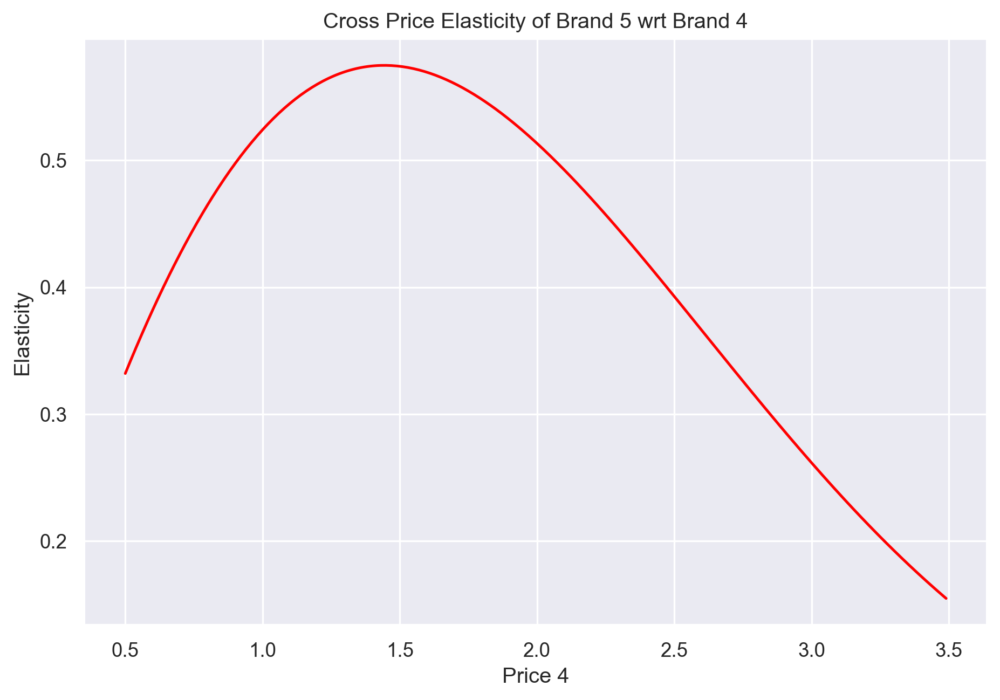

In [91]:
# Here we examine the cross price elasticity of purchase probability for brand 5 with respect to brand 4.
# We observe they are positive. As the price of the competitor brand increases, 
# so does the probability for purchasing our own brand.
# Even though the elasticity starts to decrease from the 1.45 mark, it is still positive, 
# signalling that the increase in purchase probability for the own brand happens more slowly.
plt.figure(figsize = (9, 6))
plt.plot(price_range, brand5_cross_brand4_price_elasticity, color = 'Red')
plt.xlabel('Price 4')
plt.ylabel('Elasticity')
plt.title('Cross Price Elasticity of Brand 5 wrt Brand 4')

# own and Cross-price elasticity by segment

## Well off (Segment 3)

In [92]:
brand_choice_s3 = df_pa[df_pa['Incidence']==1]
brand_choice_s3 = brand_choice_s3[brand_choice_s3['Segment']==3]

In [93]:
pd.options.display.max_rows =100
brand_choice_s3

,ID,Day,Incidence,Brand,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,...,Age,Education,Income,Occupation,Settlement size,Segment,Segment_0,Segment_1,Segment_2,Segment_3
101,200000002,6,1,4,1,0,0,1.59,1.87,2.01,...,52,2,159052,2,1,3,0,0,0,1
115,200000002,100,1,4,2,0,0,1.47,1.90,1.95,...,52,2,159052,2,1,3,0,0,0,1
138,200000002,283,1,4,3,0,0,1.37,1.89,2.00,...,52,2,159052,2,1,3,0,0,0,1
141,200000002,307,1,4,1,0,0,1.34,1.89,2.01,...,52,2,159052,2,1,3,0,0,0,1
153,200000002,422,1,4,1,0,0,1.34,1.89,2.02,...,52,2,159052,2,1,3,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57346,200000489,687,1,4,1,4,1,1.50,1.87,2.06,...,44,2,193816,2,1,3,0,0,0,1
57347,200000489,693,1,4,2,4,1,1.42,1.51,2.02,...,44,2,193816,2,1,3,0,0,0,1
57348,200000489,701,1,4,3,4,1,1.42,1.85,1.99,...,44,2,193816,2,1,3,0,0,0,1
57350,200000489,715,1,4,2,0,0,1.50,1.80,2.09,...,44,2,193816,2,1,3,0,0,0,1


In [94]:
# Brand Choice Model estimation.
Y = brand_choice_s3['Brand']
brand_choice_s3 = pd.get_dummies(brand_choice_s3, columns=['Brand'], prefix = 'Brand', prefix_sep = '_')
X = brand_choice_s3[features]
model_brand_choice_s3 = LogisticRegression(solver = 'sag', multi_class = 'multinomial', max_iter = 300)
model_brand_choice_s3.fit(X, Y)

# Coefficients table for segment 3
bc_coef = pd.DataFrame(np.transpose(model_brand_choice_s3.coef_))
bc_coef.columns = [coefficient]
bc_coef.index = [price]
bc_coef = bc_coef.round(2)
bc_coef

,coef_brand1,coef_brand2,coef_brand3,coef_brand4,coef_brand5
Price_1,-2.15,1.33,0.78,0.13,-0.10
Price_2,-0.95,-1.37,1.24,0.79,0.29
Price_3,2.00,-1.67,-0.41,-0.01,0.09
Price_4,2.52,0.95,-0.20,-1.92,-1.34
Price_5,-1.00,-0.30,1.18,0.56,-0.44


# own brand price elasticity

In [95]:
# Calculating own-brand price elasticity for brand 5 and the Well-off segment.
df_own_brand_5_s3 = pd.DataFrame(index = np.arange(price_range.size))
df_own_brand_5_s3['Price_1'] = brand_choice_s3['Price_1'].mean()
df_own_brand_5_s3['Price_2'] = brand_choice_s3['Price_2'].mean()
df_own_brand_5_s3['Price_3'] = brand_choice_s3['Price_3'].mean()
df_own_brand_5_s3['Price_4'] = brand_choice_s3['Price_4'].mean()
df_own_brand_5_s3['Price_5'] = price_range

predict_own_brand_5_s3 = model_brand_choice_s3.predict_proba(df_own_brand_5_s3)
pr_own_brand_5_s3 = predict_own_brand_5_s3[: ][: , 4]

own_price_elasticity_brand_5_s3 =  beta5 * price_range * (1 - pr_own_brand_5_s3)
df_price_elasticities['Brand 5 S3'] = own_price_elasticity_brand_5_s3

# Cross Brand Elasticity

In [96]:
# Calculating cross-brand price elasticity for brand 5 with respect to brand 4 for the Well-off segment.
df_brand5_cross_brand4_s3 = pd.DataFrame(index = np.arange(price_range.size))
df_brand5_cross_brand4_s3['Price_1'] = brand_choice_s3['Price_1'].mean()
df_brand5_cross_brand4_s3['Price_2'] = brand_choice_s3['Price_2'].mean()
df_brand5_cross_brand4_s3['Price_3'] = brand_choice_s3['Price_3'].mean()
df_brand5_cross_brand4_s3['Price_4'] = price_range
df_brand5_cross_brand4_s3['Price_5'] = brand_choice_s3['Price_5'].mean()

predict_brand5_cross_brand4_s3 = model_brand_choice_s3.predict_proba(df_brand5_cross_brand4_s3)
pr_cross_brand_5_s3 = predict_brand5_cross_brand4_s3[: ][: , 3]

# Update master data frame to include the newly obtained cross-brand price elasticities.
brand5_cross_brand4_price_elasticity_s3 = -beta5 * price_range * pr_cross_brand_5_s3
df_price_elasticities['Brand_5_Cross_Brand_4_S3'] = brand5_cross_brand4_price_elasticity_s3
pd.options.display.max_rows = None
df_price_elasticities

,Price_Point,Mean_pe,PE_Segment_1,PE_Segment_2,PE_Segment_3,PE_Segment_0,Elasticity_promotion,Elasticity_Promotion_0,Brand_5,Brand_5_Cross_Brand_4,Brand 5 S3,Brand_5_Cross_Brand_4_S3
0,0.50,-0.096352,-0.118700,-0.210433,-0.165259,-0.032200,-0.125808,-0.195749,-0.049055,0.332011,-0.298397,0.482872
1,0.51,-0.100418,-0.122884,-0.216980,-0.170179,-0.034026,-0.129927,-0.201873,-0.050616,0.337287,-0.304455,0.492184
2,0.52,-0.104611,-0.127161,-0.223634,-0.175173,-0.035941,-0.134125,-0.208100,-0.052206,0.342506,-0.310524,0.501480
3,0.53,-0.108933,-0.131535,-0.230396,-0.180241,-0.037950,-0.138402,-0.214431,-0.053827,0.347668,-0.316602,0.510761
4,0.54,-0.113389,-0.136005,-0.237267,-0.185384,-0.040055,-0.142761,-0.220865,-0.055477,0.352773,-0.322691,0.520026
5,0.55,-0.117982,-0.140574,-0.244248,-0.190601,-0.042261,-0.147201,-0.227405,-0.057158,0.357820,-0.328791,0.529274
6,0.56,-0.122714,-0.145242,-0.251339,-0.195895,-0.044573,-0.151725,-0.234050,-0.058870,0.362809,-0.334903,0.538507
7,0.57,-0.127590,-0.150013,-0.258542,-0.201265,-0.046996,-0.156333,-0.240802,-0.060614,0.367740,-0.341027,0.547723
8,0.58,-0.132612,-0.154886,-0.265856,-0.206711,-0.049533,-0.161025,-0.247661,-0.062390,0.372614,-0.347162,0.556923
9,0.59,-0.137784,-0.159864,-0.273283,-0.212235,-0.052190,-0.165803,-0.254628,-0.064199,0.377429,-0.353311,0.566106


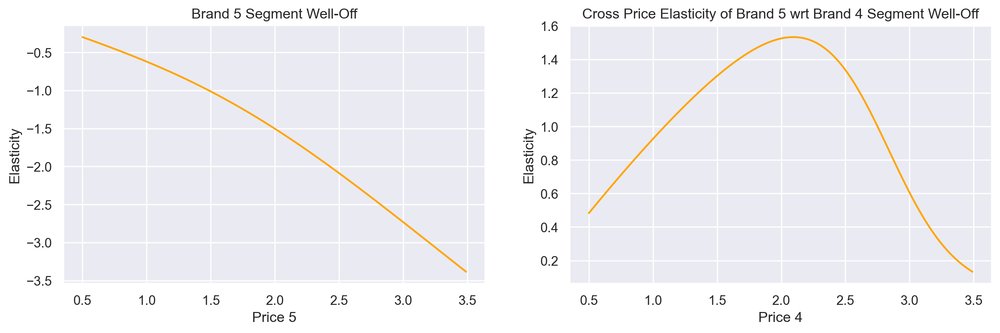

In [97]:
# Using a figure with axes we plot the own brand and cross-brand price elasticities for brand 5 cross brand 4 side by side.
fig, axs = plt.subplots(1, 2, figsize = (14, 4))
axs[0].plot(price_range, own_price_elasticity_brand_5_s3, color = 'orange')
axs[0].set_title('Brand 5 Segment Well-Off')
axs[0].set_xlabel('Price 5')

axs[1].plot(price_range, brand5_cross_brand4_price_elasticity_s3, color = 'orange')
axs[1].set_title('Cross Price Elasticity of Brand 5 wrt Brand 4 Segment Well-Off')
axs[1].set_xlabel('Price 4')

for ax in axs.flat:
    ax.set(ylabel = 'Elasticity')

# Standard

In [98]:
brand_choice_s0 = df_pa[df_pa['Incidence'] == 1]
brand_choice_s0 = brand_choice_s0[brand_choice_s0['Segment'] == 0]
brand_choice_s0.head()

,ID,Day,Incidence,Brand,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,...,Age,Education,Income,Occupation,Settlement size,Segment,Segment_0,Segment_1,Segment_2,Segment_3
6,200000001,28,1,2,2,0,0,1.50,1.90,1.99,...,47,1,110866,1,0,0,1,0,0,0
11,200000001,58,1,5,1,0,0,1.39,1.90,1.91,...,47,1,110866,1,0,0,1,0,0,0
19,200000001,110,1,1,2,0,0,1.47,1.90,1.99,...,47,1,110866,1,0,0,1,0,0,0
24,200000001,142,1,4,1,0,0,1.21,1.35,1.99,...,47,1,110866,1,0,0,1,0,0,0
29,200000001,183,1,2,3,0,0,1.46,1.88,1.97,...,47,1,110866,1,0,0,1,0,0,0


In [99]:
Y = brand_choice_s0['Brand']
brand_choice_s0 = pd.get_dummies(brand_choice_s0, columns=['Brand'], prefix = 'Brand', prefix_sep = '_')
X = brand_choice_s0[features]
model_brand_choice_s0 = LogisticRegression(solver = 'sag', multi_class = 'multinomial', max_iter = 200)
model_brand_choice_s0.fit(X, Y)

bc_coef = pd.DataFrame(np.transpose(model_brand_choice_s0.coef_))
bc_coef.columns = [coefficient]
bc_coef.index = [price]
bc_coef = bc_coef.round(2)

C:\Users\gaura\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


# Own Brand Price Elasticity

In [100]:
df_own_brand_5_s0 = pd.DataFrame(index = np.arange(price_range.size))
df_own_brand_5_s0['Price_1'] = brand_choice_s0['Price_1'].mean()
df_own_brand_5_s0['Price_2'] = brand_choice_s0['Price_2'].mean()
df_own_brand_5_s0['Price_3'] = brand_choice_s0['Price_3'].mean()
df_own_brand_5_s0['Price_4'] = brand_choice_s0['Price_4'].mean()
df_own_brand_5_s0['Price_5'] = price_range

predict_own_brand_5_s0 = model_brand_choice_s0.predict_proba(df_own_brand_5_s0)
pr_own_brand_5_s0 = predict_own_brand_5_s0[: ][: , 4]

own_price_elasticity_brand_5_s0 =  beta5 * price_range * (1 - pr_own_brand_5_s0)
df_price_elasticities.insert(10, column = 'Brand 5 S0', value = own_price_elasticity_brand_5_s0)

# Cross brand elasticity 

In [101]:
df_brand5_cross_brand4_s0 = pd.DataFrame(index = np.arange(price_range.size))
df_brand5_cross_brand4_s0['Price_1'] = brand_choice_s0['Price_1'].mean()
df_brand5_cross_brand4_s0['Price_2'] = brand_choice_s0['Price_2'].mean()
df_brand5_cross_brand4_s0['Price_3'] = brand_choice_s0['Price_3'].mean()
df_brand5_cross_brand4_s0['Price_4'] = price_range
df_brand5_cross_brand4_s0['Price_5'] = brand_choice_s0['Price_5'].mean()

predict_brand5_cross_brand4_s0 = model_brand_choice_s0.predict_proba(df_brand5_cross_brand4_s0)
pr_cross_brand_5_s0 = predict_brand5_cross_brand4_s0[: ][: , 3]

brand5_cross_brand4_price_elasticity_s0 = -beta5 * price_range * pr_cross_brand_5_s0
df_price_elasticities.insert(11, column = 'Brand_5_Cross_Brand_4_S0', value = brand5_cross_brand4_price_elasticity_s0)

# Career Focused

In [102]:
brand_choice_s1 = df_pa[df_pa['Incidence'] == 1]
brand_choice_s1 = brand_choice_s1[brand_choice_s1['Segment'] == 1]

In [103]:
Y = brand_choice_s1['Brand']
brand_choice_s1 = pd.get_dummies(brand_choice_s1, columns=['Brand'], prefix = 'Brand', prefix_sep = '_')
X = brand_choice_s1[features]
model_brand_choice_s1 = LogisticRegression(solver = 'sag', multi_class = 'multinomial', max_iter = 300)
model_brand_choice_s1.fit(X, Y)

bc_coef = pd.DataFrame(np.transpose(model_brand_choice_s1.coef_))
bc_coef.columns = [coefficient]
bc_coef.index = [price]
bc_coef = bc_coef.round(2)

# own brand elasticty

In [104]:
df_own_brand_5_s1 = pd.DataFrame(index = np.arange(price_range.size))
df_own_brand_5_s1['Price_1'] = brand_choice_s1['Price_1'].mean()
df_own_brand_5_s1['Price_2'] = brand_choice_s1['Price_2'].mean()
df_own_brand_5_s1['Price_3'] = brand_choice_s1['Price_3'].mean()
df_own_brand_5_s1['Price_4'] = brand_choice_s1['Price_4'].mean()
df_own_brand_5_s1['Price_5'] = price_range

predict_own_brand_5_s1 = model_brand_choice_s1.predict_proba(df_own_brand_5_s1)
pr_own_brand_5_s1 = predict_own_brand_5_s1[: ][: , 4]

own_price_elasticity_brand_5_s1 =  beta5 * price_range * (1 - pr_own_brand_5_s1)
df_price_elasticities.insert(12, column = 'Brand 5 S1', value = own_price_elasticity_brand_5_s1)

# Cross brand elacity

In [105]:
df_brand5_cross_brand4_s1 = pd.DataFrame(index = np.arange(price_range.size))
df_brand5_cross_brand4_s1['Price_1'] = brand_choice_s1['Price_1'].mean()
df_brand5_cross_brand4_s1['Price_2'] = brand_choice_s1['Price_2'].mean()
df_brand5_cross_brand4_s1['Price_3'] = brand_choice_s1['Price_3'].mean()
df_brand5_cross_brand4_s1['Price_4'] = price_range
df_brand5_cross_brand4_s1['Price_5'] = brand_choice_s1['Price_5'].mean()

predict_brand5_cross_brand4_s1 = model_brand_choice_s1.predict_proba(df_brand5_cross_brand4_s1)
pr_cross_brand_5_s1 = predict_brand5_cross_brand4_s1[: ][: , 3]

brand5_cross_brand4_price_elasticity_s1 = -beta5 * price_range * pr_cross_brand_5_s1
df_price_elasticities.insert(13, column = 'Brand_5_Cross_Brand_4_S1', value = brand5_cross_brand4_price_elasticity_s1)

# Fewer brand elasticity

In [106]:
brand_choice_s2 = df_pa[df_pa['Incidence'] == 1]
brand_choice_s2 = brand_choice_s2[brand_choice_s2['Segment'] == 2]

In [107]:
Y = brand_choice_s2['Brand']
brand_choice_s2 = pd.get_dummies(brand_choice_s2, columns=['Brand'], prefix = 'Brand', prefix_sep = '_')
X = brand_choice_s2[features]
model_brand_choice_s2 = LogisticRegression(solver = 'sag', multi_class = 'multinomial', max_iter = 300)
model_brand_choice_s2.fit(X, Y)

bc_coef = pd.DataFrame(np.transpose(model_brand_choice_s2.coef_))
bc_coef.columns = [coefficient]
bc_coef.index = [price]
bc_coef = bc_coef.round(2)

# own brand elasticity

In [108]:
df_own_brand_5_s2 = pd.DataFrame(index = np.arange(price_range.size))
df_own_brand_5_s2['Price_1'] = brand_choice_s2['Price_1'].mean()
df_own_brand_5_s2['Price_2'] = brand_choice_s2['Price_2'].mean()
df_own_brand_5_s2['Price_3'] = brand_choice_s2['Price_3'].mean()
df_own_brand_5_s2['Price_4'] = brand_choice_s2['Price_4'].mean()
df_own_brand_5_s2['Price_5'] = price_range

predict_own_brand_5_s2 = model_brand_choice_s2.predict_proba(df_own_brand_5_s2)
pr_own_brand_5_s2 = predict_own_brand_5_s2[: ][: , 4]

own_price_elasticity_brand_5_s2 =  beta5 * price_range * (1 - pr_own_brand_5_s2)
df_price_elasticities.insert(14, column = 'Brand 5 S2', value = own_price_elasticity_brand_5_s2)

# Cross brand elasticity 

In [109]:
df_brand5_cross_brand4_s2 = pd.DataFrame(index = np.arange(price_range.size))
df_brand5_cross_brand4_s2['Price_1'] = brand_choice_s2['Price_1'].mean()
df_brand5_cross_brand4_s2['Price_2'] = brand_choice_s2['Price_2'].mean()
df_brand5_cross_brand4_s2['Price_3'] = brand_choice_s2['Price_3'].mean()
df_brand5_cross_brand4_s2['Price_4'] = price_range
df_brand5_cross_brand4_s2['Price_5'] = brand_choice_s2['Price_5'].mean()

predict_brand5_cross_brand4_s2 = model_brand_choice_s2.predict_proba(df_brand5_cross_brand4_s2)
pr_cross_brand_5_s2 = predict_brand5_cross_brand4_s2[: ][: , 3]

brand5_cross_brand4_price_elasticity_s2 = -beta5 * price_range * pr_cross_brand_5_s2
df_price_elasticities.insert(15, column = 'Brand_5_Cross_Brand_4_S2', value = brand5_cross_brand4_price_elasticity_s2)
df_price_elasticities

,Price_Point,Mean_pe,PE_Segment_1,PE_Segment_2,PE_Segment_3,PE_Segment_0,Elasticity_promotion,Elasticity_Promotion_0,Brand_5,Brand_5_Cross_Brand_4,Brand 5 S0,Brand_5_Cross_Brand_4_S0,Brand 5 S1,Brand_5_Cross_Brand_4_S1,Brand 5 S2,Brand_5_Cross_Brand_4_S2,Brand 5 S3,Brand_5_Cross_Brand_4_S3
0,0.50,-0.096352,-0.118700,-0.210433,-0.165259,-0.032200,-0.125808,-0.195749,-0.049055,0.332011,-0.001042,0.172734,-0.039243,0.196460,-0.115846,0.174125,-0.298397,0.482872
1,0.51,-0.100418,-0.122884,-0.216980,-0.170179,-0.034026,-0.129927,-0.201873,-0.050616,0.337287,-0.001104,0.175004,-0.040244,0.198955,-0.118885,0.176181,-0.304455,0.492184
2,0.52,-0.104611,-0.127161,-0.223634,-0.175173,-0.035941,-0.134125,-0.208100,-0.052206,0.342506,-0.001170,0.177229,-0.041256,0.201398,-0.121959,0.178185,-0.310524,0.501480
3,0.53,-0.108933,-0.131535,-0.230396,-0.180241,-0.037950,-0.138402,-0.214431,-0.053827,0.347668,-0.001239,0.179411,-0.042277,0.203790,-0.125068,0.180139,-0.316602,0.510761
4,0.54,-0.113389,-0.136005,-0.237267,-0.185384,-0.040055,-0.142761,-0.220865,-0.055477,0.352773,-0.001311,0.181550,-0.043309,0.206130,-0.128213,0.182043,-0.322691,0.520026
5,0.55,-0.117982,-0.140574,-0.244248,-0.190601,-0.042261,-0.147201,-0.227405,-0.057158,0.357820,-0.001387,0.183646,-0.044350,0.208420,-0.131394,0.183896,-0.328791,0.529274
6,0.56,-0.122714,-0.145242,-0.251339,-0.195895,-0.044573,-0.151725,-0.234050,-0.058870,0.362809,-0.001467,0.185699,-0.045401,0.210660,-0.134612,0.185700,-0.334903,0.538507
7,0.57,-0.127590,-0.150013,-0.258542,-0.201265,-0.046996,-0.156333,-0.240802,-0.060614,0.367740,-0.001552,0.187709,-0.046463,0.212849,-0.137867,0.187454,-0.341027,0.547723
8,0.58,-0.132612,-0.154886,-0.265856,-0.206711,-0.049533,-0.161025,-0.247661,-0.062390,0.372614,-0.001640,0.189676,-0.047535,0.214989,-0.141159,0.189160,-0.347162,0.556923
9,0.59,-0.137784,-0.159864,-0.273283,-0.212235,-0.052190,-0.165803,-0.254628,-0.064199,0.377429,-0.001734,0.191602,-0.048617,0.217079,-0.144489,0.190817,-0.353311,0.566106


Text(0.5, 0, 'Price 4')

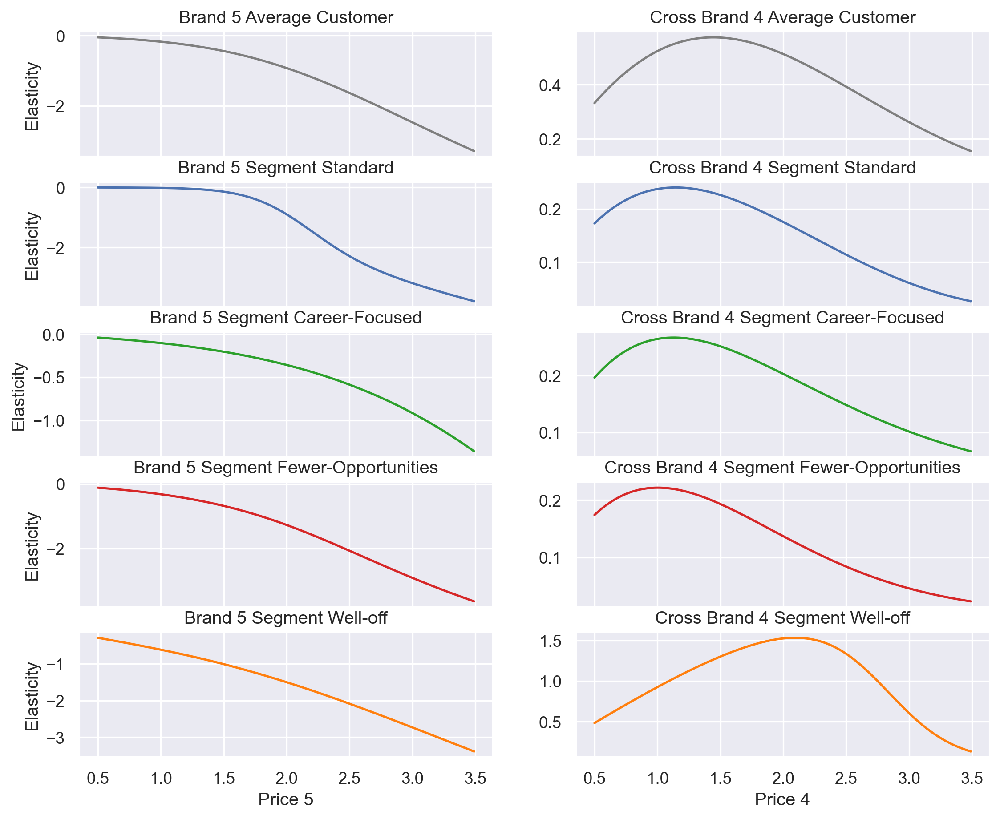

In [110]:
fig1, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, 2, figsize = (11, 9), sharex = True)
ax1[0].plot(price_range, own_price_elasticity_brand_5, 'tab:grey')
ax1[0].set_title('Brand 5 Average Customer')
ax1[0].set_ylabel('Elasticity')
ax1[1].plot(price_range, brand5_cross_brand4_price_elasticity, 'tab:grey')
ax1[1].set_title('Cross Brand 4 Average Customer')


ax2[0].plot(price_range, own_price_elasticity_brand_5_s0)
ax2[0].set_title('Brand 5 Segment Standard')
ax2[0].set_ylabel('Elasticity')
ax2[1].plot(price_range, brand5_cross_brand4_price_elasticity_s0)
ax2[1].set_title('Cross Brand 4 Segment Standard')

ax3[0].plot(price_range, own_price_elasticity_brand_5_s1, 'tab:green')
ax3[0].set_title('Brand 5 Segment Career-Focused')
ax3[0].set_ylabel('Elasticity')
ax3[1].plot(price_range, brand5_cross_brand4_price_elasticity_s1, 'tab:green')
ax3[1].set_title('Cross Brand 4 Segment Career-Focused')

ax4[0].plot(price_range, own_price_elasticity_brand_5_s2, 'tab:red')
ax4[0].set_title('Brand 5 Segment Fewer-Opportunities')
ax4[0].set_ylabel('Elasticity')
ax4[1].plot(price_range, brand5_cross_brand4_price_elasticity_s2, 'tab:red')
ax4[1].set_title('Cross Brand 4 Segment Fewer-Opportunities')

ax5[0].plot(price_range, own_price_elasticity_brand_5_s3, 'tab:orange')
ax5[0].set_title('Brand 5 Segment Well-off')
ax5[0].set_xlabel('Price 5')
ax5[0].set_ylabel('Elasticity')
ax5[1].plot(price_range, brand5_cross_brand4_price_elasticity_s3, 'tab:orange')
ax5[1].set_title('Cross Brand 4 Segment Well-off')
ax5[1].set_xlabel('Price 4')

# Price Elasticity of Purchase quality

In [111]:
df_purchase_quantity = df_pa[df_pa['Incidence']==1]
df_purchase_quantity

,ID,Day,Incidence,Brand,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,...,Age,Education,Income,Occupation,Settlement size,Segment,Segment_0,Segment_1,Segment_2,Segment_3
6,200000001,28,1,2,2,0,0,1.50,1.90,1.99,...,47,1,110866,1,0,0,1,0,0,0
11,200000001,58,1,5,1,0,0,1.39,1.90,1.91,...,47,1,110866,1,0,0,1,0,0,0
19,200000001,110,1,1,2,0,0,1.47,1.90,1.99,...,47,1,110866,1,0,0,1,0,0,0
24,200000001,142,1,4,1,0,0,1.21,1.35,1.99,...,47,1,110866,1,0,0,1,0,0,0
29,200000001,183,1,2,3,0,0,1.46,1.88,1.97,...,47,1,110866,1,0,0,1,0,0,0
52,200000001,327,1,4,3,0,0,1.47,1.89,2.01,...,47,1,110866,1,0,0,1,0,0,0
79,200000001,547,1,2,2,0,0,1.35,1.89,2.07,...,47,1,110866,1,0,0,1,0,0,0
80,200000001,562,1,2,3,2,1,1.33,1.51,2.07,...,47,1,110866,1,0,0,1,0,0,0
97,200000001,702,1,5,1,0,0,1.41,1.85,2.00,...,47,1,110866,1,0,0,1,0,0,0
101,200000002,6,1,4,1,0,0,1.59,1.87,2.01,...,52,2,159052,2,1,3,0,0,0,1


In [112]:
df_purchase_quantity = pd.get_dummies(df_purchase_quantity, columns = ['Brand'], prefix = 'Brand', prefix_sep = '_')
df_purchase_quantity.describe()

,ID,Day,Incidence,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,Price_4,...,Segment,Segment_0,Segment_1,Segment_2,Segment_3,Brand_1,Brand_2,Brand_3,Brand_4,Brand_5
count,1.463800e+04,14638.000000,14638.0,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,...,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000
mean,2.000003e+08,359.607597,1.0,2.774559,1.535251,0.406955,1.384559,1.764717,2.006694,2.159658,...,1.341235,0.294303,0.300314,0.175229,0.230154,0.092226,0.310288,0.057453,0.199959,0.340074
std,1.423786e+02,205.346253,0.0,1.796736,2.060858,0.491283,0.090944,0.181667,0.046200,0.093253,...,1.128625,0.455744,0.458410,0.380176,0.420946,0.289354,0.462627,0.232714,0.399983,0.473750
min,2.000000e+08,1.000000,1.0,1.000000,0.000000,0.000000,1.100000,1.260000,1.870000,1.760000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000001e+08,175.000000,1.0,2.000000,0.000000,0.000000,1.340000,1.570000,1.970000,2.120000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2.000003e+08,355.000000,1.0,2.000000,0.000000,0.000000,1.390000,1.880000,2.010000,2.180000,...,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,2.000004e+08,532.000000,1.0,3.000000,4.000000,1.000000,1.470000,1.890000,2.060000,2.240000,...,2.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000
max,2.000005e+08,727.000000,1.0,15.000000,5.000000,1.000000,1.590000,1.900000,2.140000,2.260000,...,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [113]:
df_purchase_quantity.columns.values

array(['ID', 'Day', 'Incidence', 'Quantity', 'Last_Inc_Brand',
       'Last_Inc_Quantity', 'Price_1', 'Price_2', 'Price_3', 'Price_4',
       'Price_5', 'Promotion_1', 'Promotion_2', 'Promotion_3',
       'Promotion_4', 'Promotion_5', 'Sex', 'Marital status', 'Age',
       'Education', 'Income', 'Occupation', 'Settlement size', 'Segment',
       'Segment_0', 'Segment_1', 'Segment_2', 'Segment_3', 'Brand_1',
       'Brand_2', 'Brand_3', 'Brand_4', 'Brand_5'], dtype=object)

In [114]:
df_purchase_quantity['Price_Incidence'] = (df_purchase_quantity['Brand_1'] * df_purchase_quantity['Price_1'] +
                                           df_purchase_quantity['Brand_2'] * df_purchase_quantity['Price_2'] +
                                           df_purchase_quantity['Brand_3'] * df_purchase_quantity['Price_3'] +
                                           df_purchase_quantity['Brand_4'] * df_purchase_quantity['Price_4'] +
                                           df_purchase_quantity['Brand_5'] * df_purchase_quantity['Price_5'] )

In [115]:
df_purchase_quantity['Promotion_Incidence'] = (df_purchase_quantity['Brand_1'] * df_purchase_quantity['Promotion_1'] +
                                               df_purchase_quantity['Brand_2'] * df_purchase_quantity['Promotion_2'] +
                                               df_purchase_quantity['Brand_3'] * df_purchase_quantity['Promotion_3'] +
                                               df_purchase_quantity['Brand_4'] * df_purchase_quantity['Promotion_4'] +
                                               df_purchase_quantity['Brand_5'] * df_purchase_quantity['Promotion_5'] )

# Model ,Logistic Regression

In [116]:
X = df_purchase_quantity[['Price_Incidence', 'Promotion_Incidence']]
pd.options.display.max_rows = 100
X

,Price_Incidence,Promotion_Incidence
6,1.90,0
11,2.62,1
19,1.47,0
24,2.16,0
29,1.88,0
...,...,...
58621,1.89,0
58648,1.35,1
58674,1.85,1
58687,1.51,0


In [117]:
Y = df_purchase_quantity['Quantity']
Y.head()

6     2
11    1
19    2
24    1
29    3
Name: Quantity, dtype: int64

In [118]:
model_quantity = LinearRegression()
model_quantity.fit(X, Y)

LinearRegression()

In [119]:
model_quantity.coef_

array([-0.8173651 , -0.10504673])

# Price elascticity Estimation

In [120]:
# We examine the price elasticity of purchase quantity with active promotional activities for each price point.
df_price_elasticity_quantity = pd.DataFrame(index = np.arange(price_range.size))
df_price_elasticity_quantity['Price_Incidence'] = price_range
df_price_elasticity_quantity['Promotion_Incidence'] = 1

In [121]:
#Take the coefficient for price.
beta_quantity = model_quantity.coef_[0]
beta_quantity

-0.8173651016685045

In [122]:
predict_quantity = model_quantity.predict(df_price_elasticity_quantity)

In [123]:
# We calculate the price elasticity with our new formula. It is the beta coefficient for price multiplied by price
# and divided by the purchase quantity.
price_elasticity_quantity_promotion_yes = beta_quantity * price_range / predict_quantity

In [125]:
df_price_elasticities['PE_Quantity_Promotion_1'] = price_elasticity_quantity_promotion_yes
df_price_elasticities

,Price_Point,Mean_pe,PE_Segment_1,PE_Segment_2,PE_Segment_3,PE_Segment_0,Elasticity_promotion,Elasticity_Promotion_0,Brand_5,Brand_5_Cross_Brand_4,Brand 5 S0,Brand_5_Cross_Brand_4_S0,Brand 5 S1,Brand_5_Cross_Brand_4_S1,Brand 5 S2,Brand_5_Cross_Brand_4_S2,Brand 5 S3,Brand_5_Cross_Brand_4_S3,PE_Quantity_Promotion_1
0,0.50,-0.096352,-0.118700,-0.210433,-0.165259,-0.032200,-0.125808,-0.195749,-0.049055,0.332011,-0.001042,0.172734,-0.039243,0.196460,-0.115846,0.174125,-0.298397,0.482872,-0.102157
1,0.51,-0.100418,-0.122884,-0.216980,-0.170179,-0.034026,-0.129927,-0.201873,-0.050616,0.337287,-0.001104,0.175004,-0.040244,0.198955,-0.118885,0.176181,-0.304455,0.492184,-0.104413
2,0.52,-0.104611,-0.127161,-0.223634,-0.175173,-0.035941,-0.134125,-0.208100,-0.052206,0.342506,-0.001170,0.177229,-0.041256,0.201398,-0.121959,0.178185,-0.310524,0.501480,-0.106679
3,0.53,-0.108933,-0.131535,-0.230396,-0.180241,-0.037950,-0.138402,-0.214431,-0.053827,0.347668,-0.001239,0.179411,-0.042277,0.203790,-0.125068,0.180139,-0.316602,0.510761,-0.108954
4,0.54,-0.113389,-0.136005,-0.237267,-0.185384,-0.040055,-0.142761,-0.220865,-0.055477,0.352773,-0.001311,0.181550,-0.043309,0.206130,-0.128213,0.182043,-0.322691,0.520026,-0.111238
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,3.45,-8.011342,-5.721777,-5.044743,-4.164495,-12.412562,-4.862519,-4.984020,-3.231573,0.162233,-3.746045,0.028579,-1.319096,0.068695,-3.592451,0.024052,-3.331949,0.153491,-1.774292
296,3.46,-8.036589,-5.742027,-5.061591,-4.179830,-12.449126,-4.880720,-5.000927,-3.247767,0.160333,-3.757487,0.028049,-1.329301,0.068081,-3.606356,0.023695,-3.345277,0.148181,-1.788634
297,3.47,-8.061802,-5.762241,-5.078420,-4.195148,-12.485673,-4.898891,-5.017813,-3.263929,0.158447,-3.768908,0.027527,-1.339561,0.067472,-3.620216,0.023343,-3.358604,0.143033,-1.803124
298,3.48,-8.086982,-5.782417,-5.095231,-4.210447,-12.522203,-4.917032,-5.034680,-3.280058,0.156575,-3.780310,0.027012,-1.349877,0.066866,-3.634032,0.022996,-3.371927,0.138045,-1.817766


Text(0.5, 1.0, 'Price Elasticity of Purchase Quantity with Promotion')

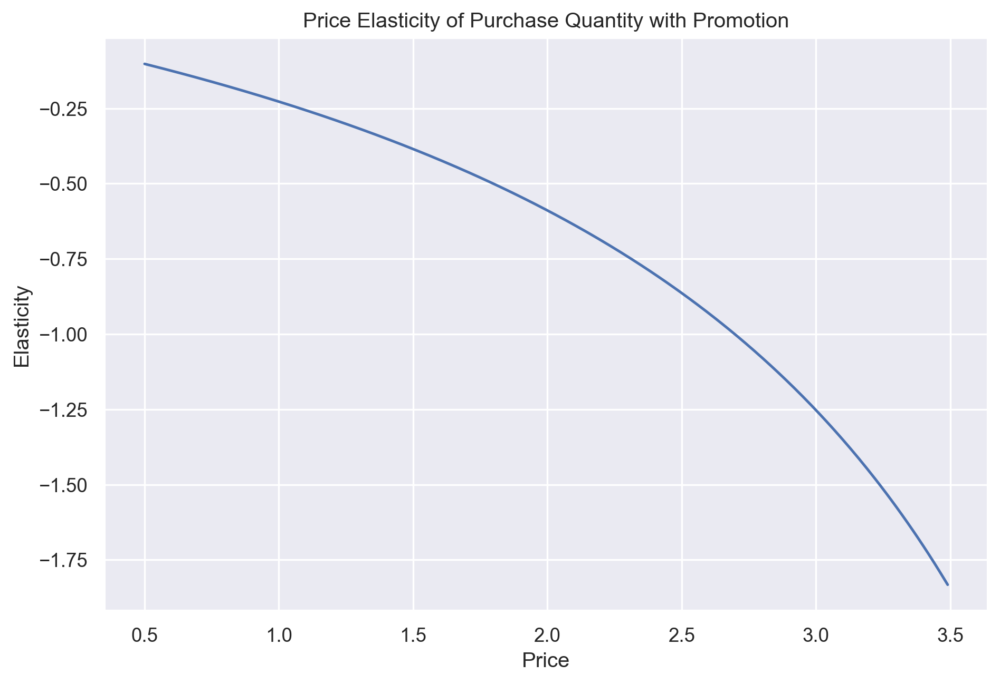

In [126]:
plt.figure(figsize = (9, 6))
plt.plot(price_range, price_elasticity_quantity_promotion_yes)
plt.xlabel('Price')
plt.ylabel('Elasticity')
plt.title('Price Elasticity of Purchase Quantity with Promotion')

# Price elasticity without promotion

In [127]:
# Overwrite promotion incidence in order to use the same df. 
# Here we assume there are no promotinal activities active for the entire price range.
df_price_elasticity_quantity['Promotion_Incidence'] = 0
# Find the new predicted quantities.
predict_quantity = model_quantity.predict(df_price_elasticity_quantity)
# Calculate the new price elasticities.
price_elasticity_quantity_promotion_no = beta_quantity * price_range / predict_quantity
# Add the results to the master data frame.
df_price_elasticities['PE_Quantity_Promotion_0'] = price_elasticity_quantity_promotion_no
df_price_elasticities

,Price_Point,Mean_pe,PE_Segment_1,PE_Segment_2,PE_Segment_3,PE_Segment_0,Elasticity_promotion,Elasticity_Promotion_0,Brand_5,Brand_5_Cross_Brand_4,Brand 5 S0,Brand_5_Cross_Brand_4_S0,Brand 5 S1,Brand_5_Cross_Brand_4_S1,Brand 5 S2,Brand_5_Cross_Brand_4_S2,Brand 5 S3,Brand_5_Cross_Brand_4_S3,PE_Quantity_Promotion_1,PE_Quantity_Promotion_0
0,0.50,-0.096352,-0.118700,-0.210433,-0.165259,-0.032200,-0.125808,-0.195749,-0.049055,0.332011,-0.001042,0.172734,-0.039243,0.196460,-0.115846,0.174125,-0.298397,0.482872,-0.102157,-0.099543
1,0.51,-0.100418,-0.122884,-0.216980,-0.170179,-0.034026,-0.129927,-0.201873,-0.050616,0.337287,-0.001104,0.175004,-0.040244,0.198955,-0.118885,0.176181,-0.304455,0.492184,-0.104413,-0.101736
2,0.52,-0.104611,-0.127161,-0.223634,-0.175173,-0.035941,-0.134125,-0.208100,-0.052206,0.342506,-0.001170,0.177229,-0.041256,0.201398,-0.121959,0.178185,-0.310524,0.501480,-0.106679,-0.103939
3,0.53,-0.108933,-0.131535,-0.230396,-0.180241,-0.037950,-0.138402,-0.214431,-0.053827,0.347668,-0.001239,0.179411,-0.042277,0.203790,-0.125068,0.180139,-0.316602,0.510761,-0.108954,-0.106150
4,0.54,-0.113389,-0.136005,-0.237267,-0.185384,-0.040055,-0.142761,-0.220865,-0.055477,0.352773,-0.001311,0.181550,-0.043309,0.206130,-0.128213,0.182043,-0.322691,0.520026,-0.111238,-0.108369
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,3.45,-8.011342,-5.721777,-5.044743,-4.164495,-12.412562,-4.862519,-4.984020,-3.231573,0.162233,-3.746045,0.028579,-1.319096,0.068695,-3.592451,0.024052,-3.331949,0.153491,-1.774292,-1.664290
296,3.46,-8.036589,-5.742027,-5.061591,-4.179830,-12.449126,-4.880720,-5.000927,-3.247767,0.160333,-3.757487,0.028049,-1.329301,0.068081,-3.606356,0.023695,-3.345277,0.148181,-1.788634,-1.677205
297,3.47,-8.061802,-5.762241,-5.078420,-4.195148,-12.485673,-4.898891,-5.017813,-3.263929,0.158447,-3.768908,0.027527,-1.339561,0.067472,-3.620216,0.023343,-3.358604,0.143033,-1.803124,-1.690246
298,3.48,-8.086982,-5.782417,-5.095231,-4.210447,-12.522203,-4.917032,-5.034680,-3.280058,0.156575,-3.780310,0.027012,-1.349877,0.066866,-3.634032,0.022996,-3.371927,0.138045,-1.817766,-1.703414


Text(0.5, 1.0, 'Price Elasticity of Purchase Quantity with Promotion')

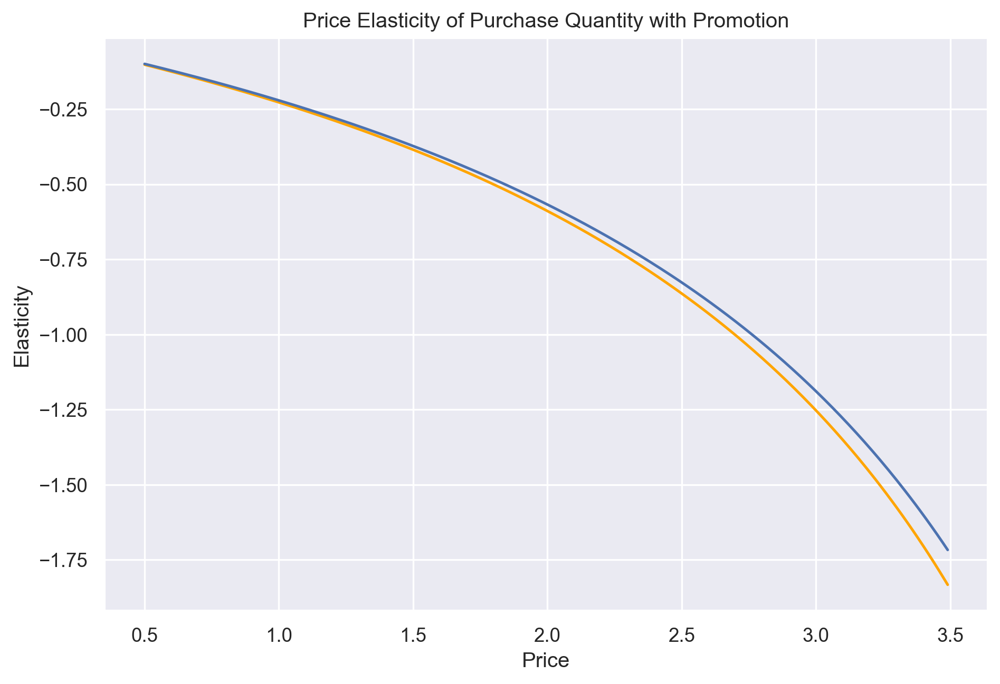

In [128]:
# Plot the two elasticities side by side. 
plt.figure(figsize = (9, 6))
plt.plot(price_range, price_elasticity_quantity_promotion_yes, color = 'orange')
plt.plot(price_range, price_elasticity_quantity_promotion_no)
plt.xlabel('Price')
plt.ylabel('Elasticity')
plt.title('Price Elasticity of Purchase Quantity with Promotion')